In [350]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [351]:
np.random.seed(42)

In [352]:
cluster_generator = CorrelatedClusterGenerator(n_samples=5000,n_features=20,n_clusters=5,correlation=0.6,random_state=42)

In [353]:
X, y = cluster_generator.generate_clusters()

In [354]:
X = X + np.random.normal(scale=3,size=X.shape) 

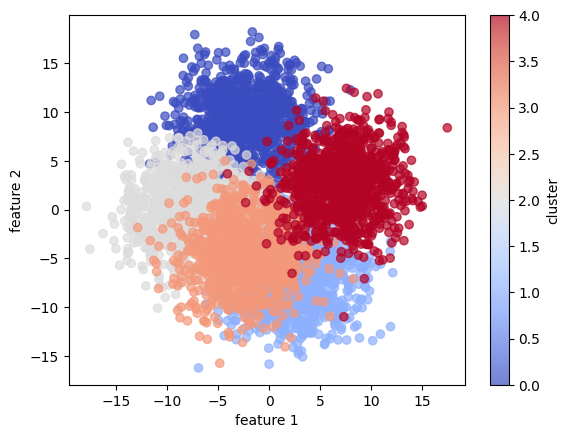

In [355]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

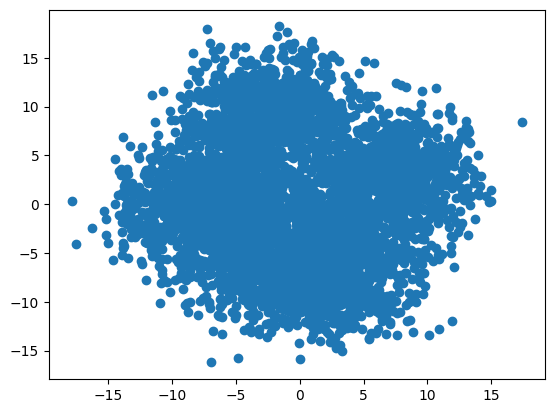

In [356]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [357]:
corr_dataset = pd.DataFrame(X) 

In [358]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [359]:
corr_dataset['target'] = y

In [360]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,11.422073,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,10.818772,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,9.602651,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,9.190605,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,13.510499,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,3.646844,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,2.817992,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,0.881395,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,-0.766761,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4


In [361]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [362]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.032776,0.058713,-0.674579,0.232461,-0.120440,0.462301,-0.017820,0.412965,-0.027839,-0.466735,-0.137474,-0.154086,-0.104476,0.358182,-0.187904,0.308535,0.183327,0.077255,-0.123705
vab_2,-0.032776,1.000000,0.156118,0.144172,-0.371250,-0.627346,0.045708,0.342262,0.341881,0.254532,-0.546125,0.743619,0.656946,-0.675564,-0.639555,-0.616161,-0.168211,0.641435,-0.254017,-0.100687
vab_3,0.058713,0.156118,1.000000,-0.224639,-0.176168,-0.364023,-0.343748,0.570223,-0.391504,0.720189,-0.277240,-0.105004,-0.326304,-0.363028,-0.276262,-0.429039,0.534132,0.127627,0.298939,-0.231000
vab_4,-0.674579,0.144172,-0.224639,1.000000,-0.136126,0.162619,-0.363377,-0.055143,-0.154649,-0.171367,0.413301,0.311373,0.351945,0.095138,-0.343279,0.197455,-0.499723,-0.045116,-0.062820,0.292046
vab_5,0.232461,-0.371250,-0.176168,-0.136126,1.000000,0.388012,0.112296,-0.208944,0.072141,-0.280238,0.180008,-0.331344,-0.284564,0.371627,0.456402,0.323656,0.041385,-0.233041,0.222111,0.191408
vab_6,-0.120440,-0.627346,-0.364023,0.162619,0.388012,1.000000,-0.041820,-0.397307,-0.192017,-0.431419,0.634957,-0.501966,-0.369031,0.703368,0.540489,0.682732,-0.104387,-0.540486,0.198570,0.285375
vab_7,0.462301,0.045708,-0.343748,-0.363377,0.112296,-0.041820,1.000000,-0.193256,0.480214,-0.170428,-0.159140,0.124654,0.269358,0.055383,0.306557,0.066975,0.068303,0.171913,-0.437586,-0.191999
vab_8,-0.017820,0.342262,0.570223,-0.055143,-0.208944,-0.397307,-0.193256,1.000000,-0.180221,0.564308,-0.279618,0.165235,0.002101,-0.411198,-0.367451,-0.412780,0.308743,0.270575,0.087361,-0.183608
vab_9,0.412965,0.341881,-0.391504,-0.154649,0.072141,-0.192017,0.480214,-0.180221,1.000000,-0.393761,-0.461613,0.431996,0.498190,-0.246153,0.012561,-0.213707,-0.319349,0.435284,-0.190697,0.113440
vab_10,-0.027839,0.254532,0.720189,-0.171367,-0.280238,-0.431419,-0.170428,0.564308,-0.393761,1.000000,-0.187440,0.040535,-0.129454,-0.356808,-0.338033,-0.376503,0.577875,0.164829,-0.041912,-0.407507


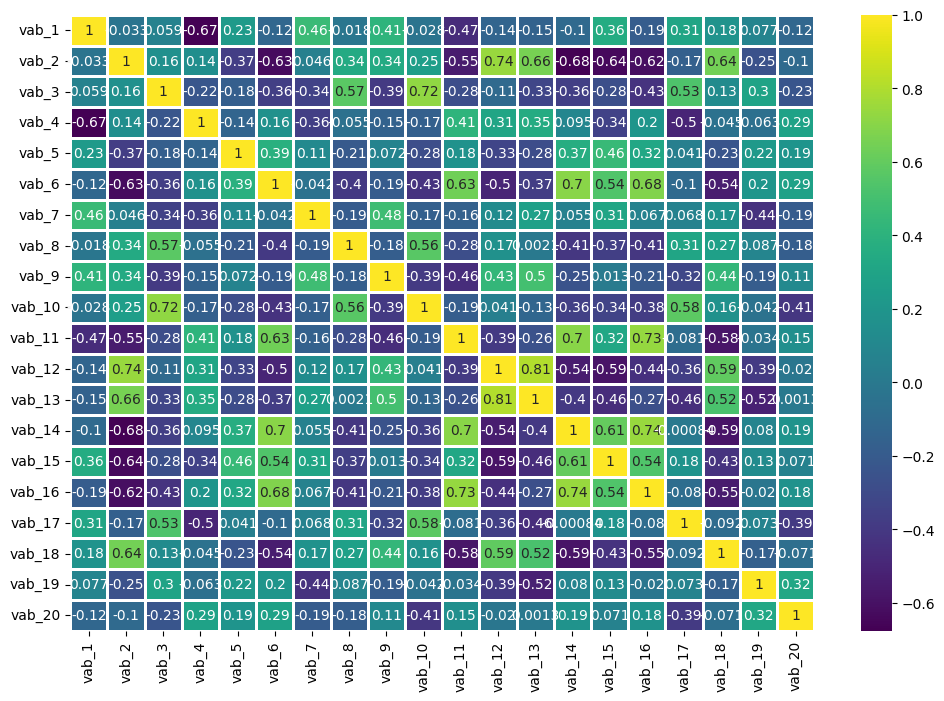

In [363]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='viridis',annot=True,linewidths=1)
plt.show()

## data standardization

In [364]:
X_values = corr_dataset.iloc[:,:-1].values

In [365]:
y_values = corr_dataset.iloc[:,-1].values

In [366]:
scaler = StandardScaler()

In [367]:
X_values = scaler.fit_transform(X_values)

In [368]:
np.mean(X_values),np.std(X_values)

(-2.7000623958883807e-17, 1.0000000000000002)

In [369]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.109188,0.794353,1.244228,0.062826,-1.291521,-1.203891,-0.930859,-0.250093,0.844727,1.122294,-1.460725,1.406401,0.597442,-1.937666,-1.599998,-1.979300,-0.236433,0.527448,-0.416983,-2.870807
1,-0.572857,1.276193,1.149163,-0.485749,-0.285284,-1.583912,-1.137671,0.663223,-0.009709,-0.368956,-1.236303,1.322145,0.898623,-1.343538,-1.733451,-2.469783,-0.264118,1.049380,0.295925,0.482276
2,-0.520931,1.130056,0.204762,0.392918,0.217199,-1.861081,-0.324974,1.447374,-0.803040,0.637012,-1.244861,1.152303,1.297400,-1.165004,-1.982296,-1.188420,-0.919103,0.459610,0.252038,0.940810
3,-0.874890,1.175526,1.420694,-0.021363,-0.729947,-1.588534,-0.056942,1.239302,0.133579,0.320302,-0.360641,1.094757,0.660080,-1.267389,-1.081874,-1.960701,-0.249729,0.832618,0.340366,1.031586
4,0.239318,1.714199,0.300233,0.500570,-1.239757,-0.499554,-1.152436,0.336441,0.429809,1.101306,-0.790438,1.698067,1.152304,-0.606315,-1.384517,-1.663626,-0.895439,1.951320,0.533949,-0.488009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1.996327,0.043564,-0.696328,-1.580056,1.145339,0.370409,2.322964,0.386128,0.682996,0.364403,-0.234149,0.320523,0.748432,0.064628,1.812371,-0.035267,-0.017625,0.541782,-1.303145,-0.867523
4996,1.368192,-0.486812,0.554663,-2.017874,0.787324,-0.886740,0.596250,-1.120658,0.913164,-0.065968,-0.613097,0.204767,0.713941,-1.863983,0.244789,0.023920,0.148906,-0.091390,-1.568975,-1.278465
4997,0.545008,1.572467,-0.625465,-1.223459,-1.041021,0.868192,1.810740,0.437848,1.025584,0.176475,-1.486452,-0.065696,0.962170,-0.411198,0.813348,-0.584261,-0.154503,-0.000919,-1.401264,-2.233496
4998,1.564347,0.190279,-0.964253,-1.863663,-1.464264,0.059785,1.823011,0.230784,1.442426,-0.004105,-0.774879,-0.295875,0.450295,-0.220014,0.551782,-0.509860,-0.084758,0.792011,-1.336576,-0.913888


<Axes: ylabel='Density'>

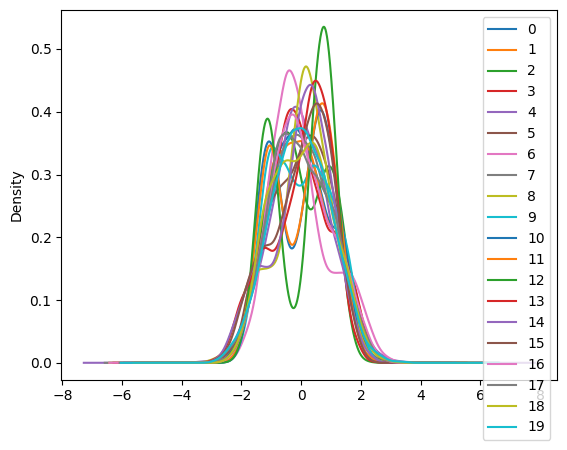

In [370]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [371]:
pca_general = PCA()

In [372]:
pca_general.fit(X_values)

PCA()

In [373]:
explained_variance = pca_general.explained_variance_ratio_

In [374]:
explained_variance

array([0.31801456, 0.19079652, 0.14997158, 0.08589745, 0.03939133,
       0.02897214, 0.02306187, 0.02104062, 0.01684855, 0.01477622,
       0.01431819, 0.01326485, 0.01254489, 0.01219125, 0.01190957,
       0.01156628, 0.00997168, 0.00967406, 0.00835216, 0.00743624])

In [375]:
eigenvalues = pca_general.explained_variance_

In [376]:
pd.DataFrame(eigenvalues)

,0
0,6.361563
1,3.816694
2,3.000032
3,1.718293
4,0.787984
5,0.579559
6,0.461330
7,0.420897
8,0.337038
9,0.295583


In [377]:
eigenvectors = pca_general.components_

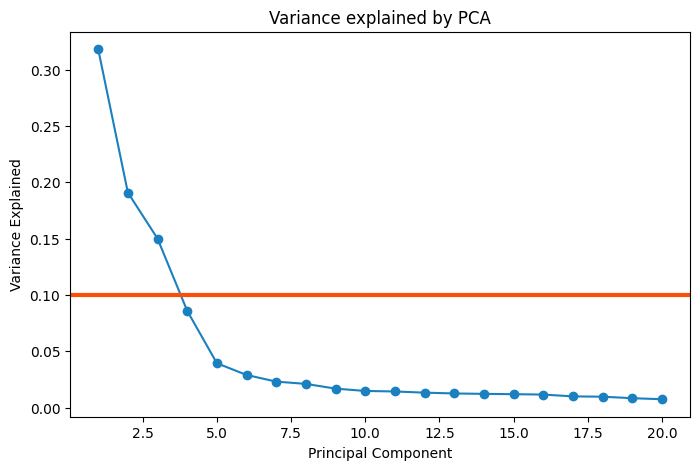

In [378]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [379]:
pca = PCA(n_components=2)

In [380]:
principal_components = pca.fit_transform(X_values)

In [381]:
pd.DataFrame(principal_components).head(8)

,0,1
0,-4.539318,0.870390
1,-4.137221,0.226077
2,-3.608921,-0.244235
3,-3.600124,0.373760
4,-4.030719,-0.522823
5,-2.812625,-0.142578
6,-4.786126,0.244090
7,-4.018980,0.698677


In [382]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2'])

In [383]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [384]:
final_df

,principal component 1,principal component 2,target
0,-4.539318,0.870390,0
1,-4.137221,0.226077,0
2,-3.608921,-0.244235,0
3,-3.600124,0.373760,0
4,-4.030719,-0.522823,0
...,...,...,...
4995,-0.129065,-0.410846,4
4996,-1.250590,0.201340,4
4997,-1.791380,-0.518493,4
4998,-1.333776,-0.505271,4


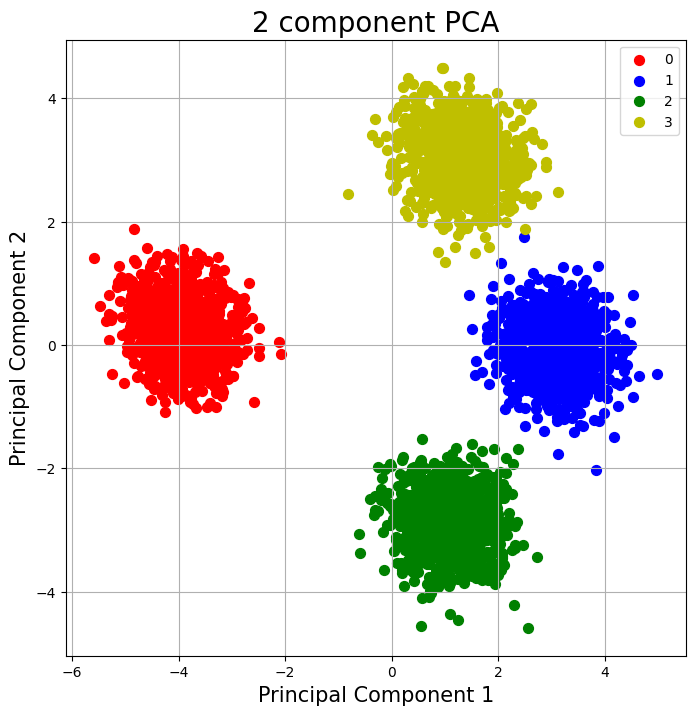

In [385]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

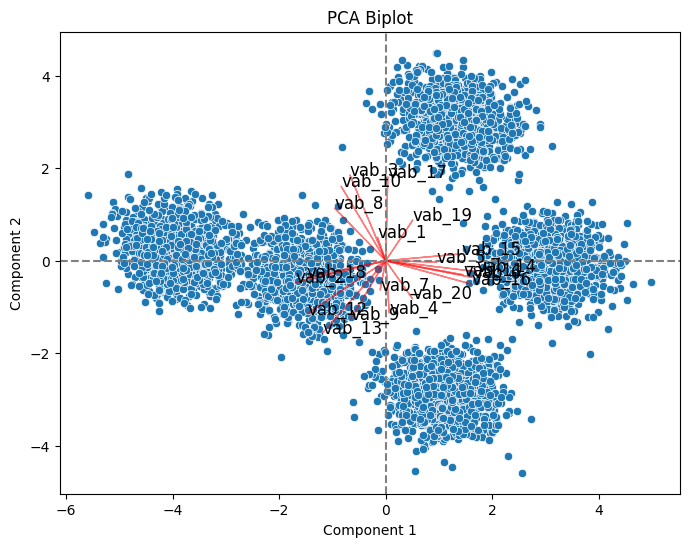

In [386]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

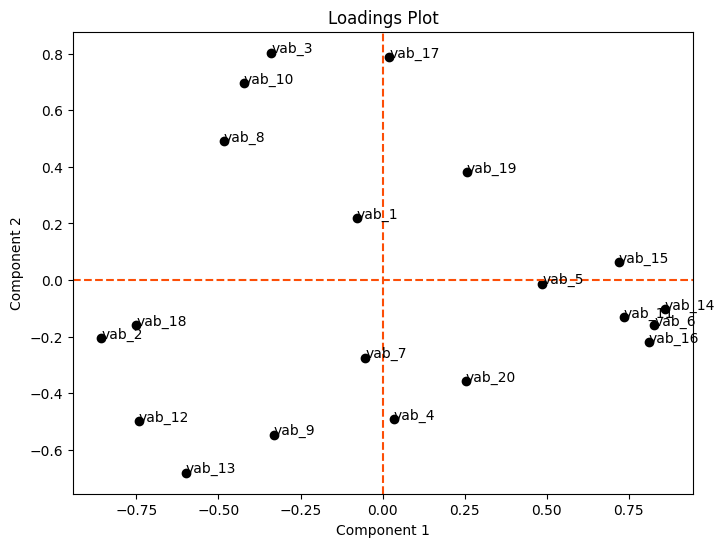

In [387]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [388]:
X_pca = pca.transform(X_values)

In [389]:
pd.DataFrame(X_pca).head()

,0,1
0,-4.539318,0.870390
1,-4.137221,0.226077
2,-3.608921,-0.244235
3,-3.600124,0.373760
4,-4.030719,-0.522823


## t-SNE

In [390]:
tsne = TSNE(n_components=2,random_state=42)

In [391]:
X_tsne = tsne.fit_transform(X_values)

In [392]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [393]:
tsne_data

,dim_1,dim_2,target
0,-50.652805,17.487574,0
1,-44.995899,7.966805,0
2,-49.011803,-6.330654,0
3,-40.645447,-1.594714,0
4,-52.646793,7.936448,0
...,...,...,...
4995,2.882181,2.762386,4
4996,-4.993155,-17.725559,4
4997,-10.126862,-15.061889,4
4998,-13.823914,-9.464581,4


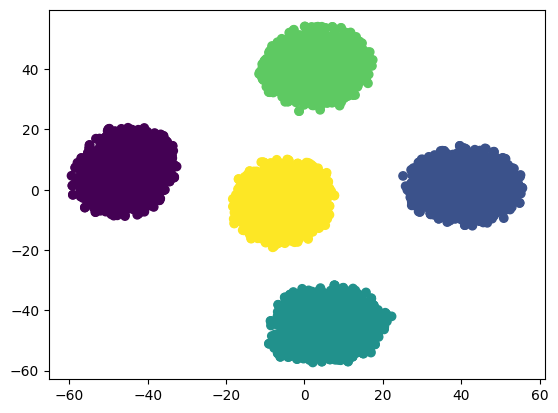

In [394]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [395]:
tsne.kl_divergence_

2.2071027755737305

## umap

In [396]:
umap = umap.UMAP(random_state=42)

In [397]:
X_umap = umap.fit_transform(X_values)

In [398]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [399]:
umap_data

,dim_1,dim_2,target
0,20.318008,-0.855307,0
1,19.601507,-0.157601,0
2,19.511482,0.784669,0
3,18.934883,0.396912,0
4,19.355209,-0.048363,0
...,...,...,...
4995,9.137848,7.505044,4
4996,9.667088,5.938938,4
4997,9.107628,5.811937,4
4998,8.550877,5.651873,4


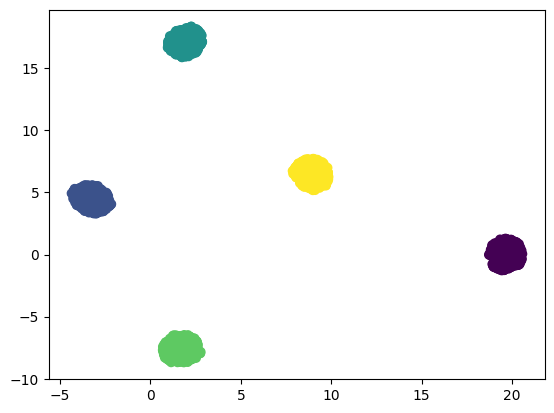

In [400]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [401]:
kmeans = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [402]:
kmeans.fit(X_values)

KMeans(n_clusters=5, random_state=42)

In [403]:
df_kmeans = corr_dataset.copy()

In [404]:
df_kmeans['k_means'] = kmeans.labels_

In [405]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


In [406]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.2
accuracy after: 1.0


In [407]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


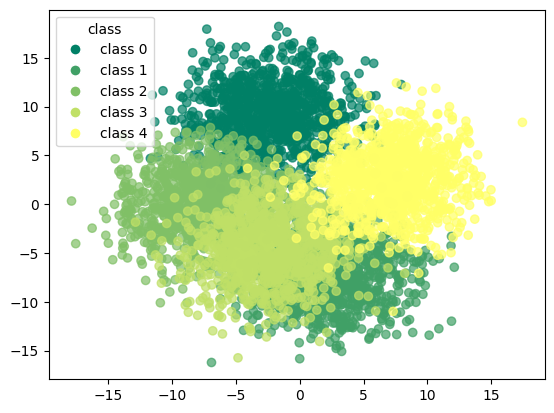

In [408]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

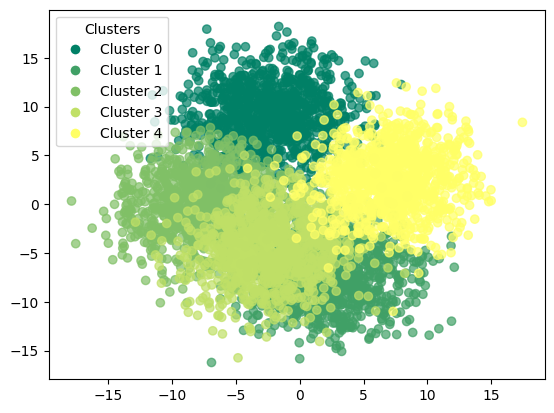

In [409]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [410]:
kmeans.cluster_centers_

array([[ 4.86161383e-01, -1.09663206e+00, -4.44558763e-01,
        -2.80726171e-01,  9.25672543e-01,  1.04210763e+00,
        -2.93895850e-01, -7.13932370e-01,  1.58977525e-01,
        -1.15333682e+00,  2.42493130e-01, -1.08685103e+00,
        -1.05280582e+00,  8.28913571e-01,  1.05790864e+00,
         6.28074015e-01, -3.35424688e-01, -7.12715931e-01,
         1.28195506e+00,  9.25930336e-01],
       [-2.97965595e-01, -7.03419590e-01,  1.15117158e+00,
        -3.35490315e-01, -8.61783848e-02,  1.76121295e-01,
        -5.16651774e-01,  6.12883022e-01, -1.51424099e+00,
         1.32085374e+00,  7.02043609e-01, -1.02686043e+00,
        -1.19767329e+00,  4.18843237e-01,  2.11430967e-01,
         3.15286633e-01,  1.35498859e+00, -7.65653576e-01,
         1.70628581e-01, -6.94718785e-01],
       [-3.07174845e-01,  1.40076897e+00,  8.61414585e-01,
         4.34232252e-01, -7.40669738e-01, -1.22240043e+00,
        -8.11988517e-01,  9.32704762e-01,  2.11722581e-01,
         6.30610595e-01, -1.1

In [411]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


In [412]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



### k-means with pca

In [413]:
kmeans_pca = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [414]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=5, random_state=42)

In [415]:
df_pca_kmeans = corr_dataset.copy()

In [416]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [417]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [418]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.2
accuracy after: 0.9962


In [419]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


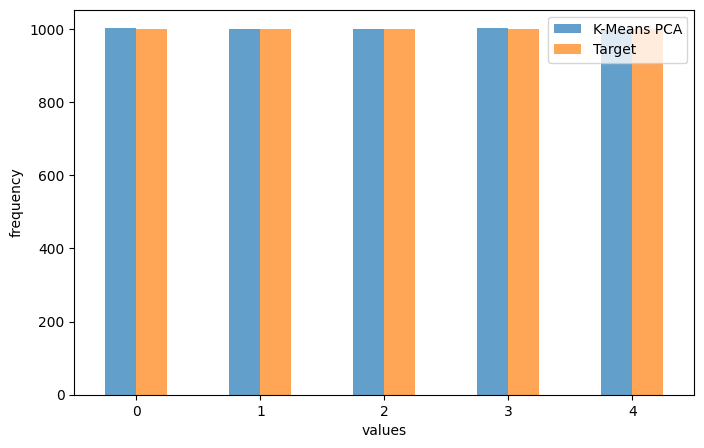

In [420]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [421]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[ 992    0    0    0    8]
 [   0  999    0    1    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [  10    0    0    0  990]]


In [422]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       0.99      0.99      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



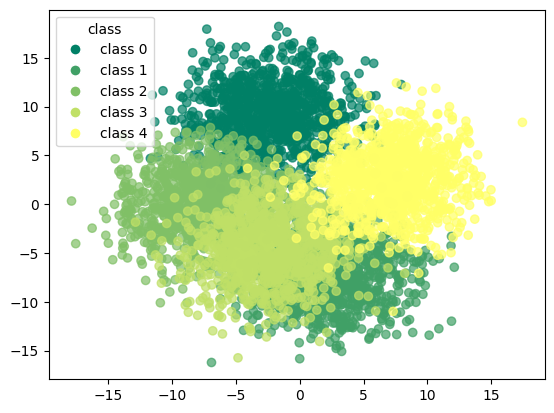

In [423]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

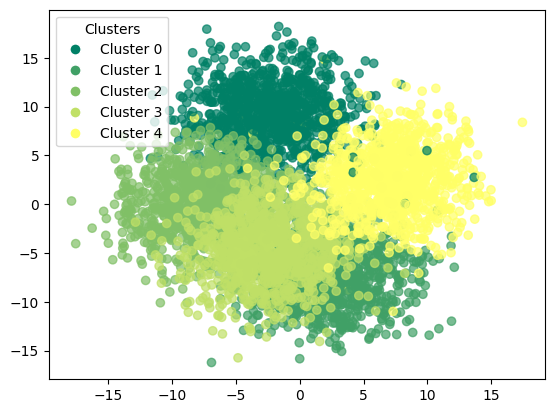

In [424]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

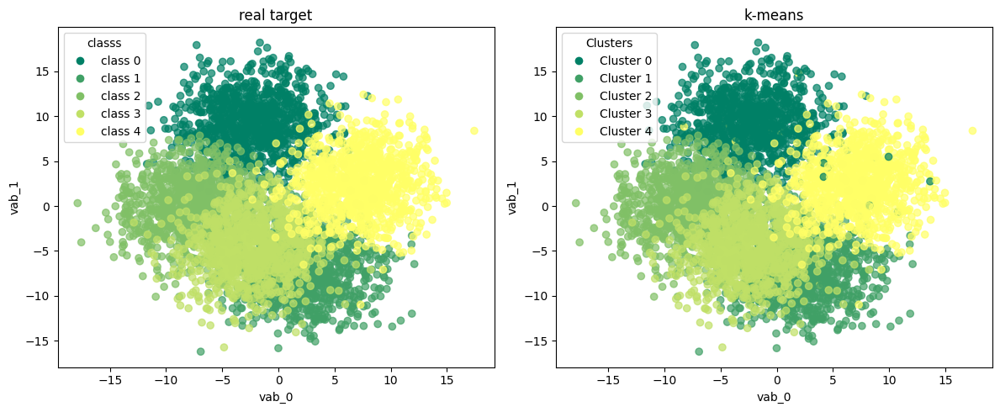

In [425]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

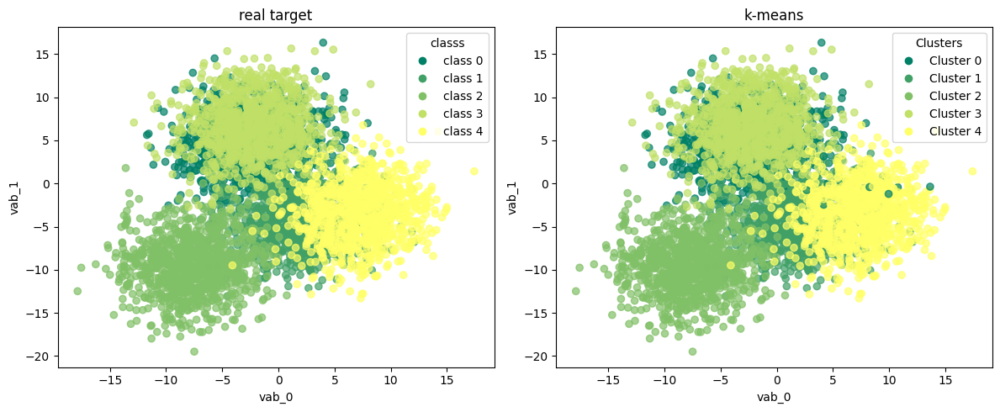

In [426]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

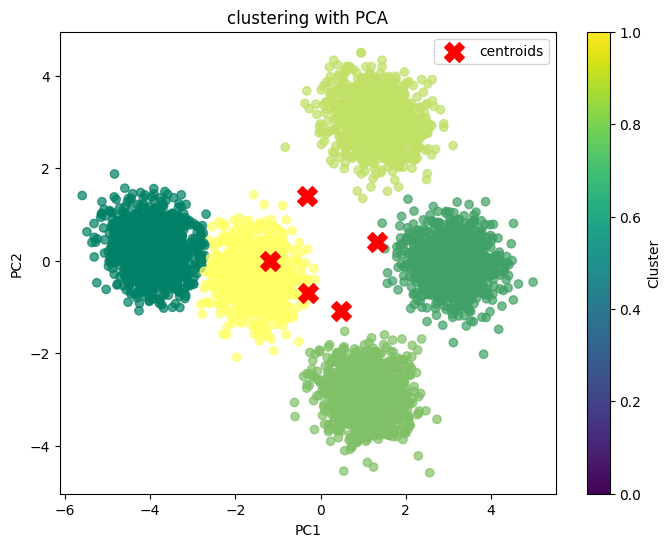

In [427]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

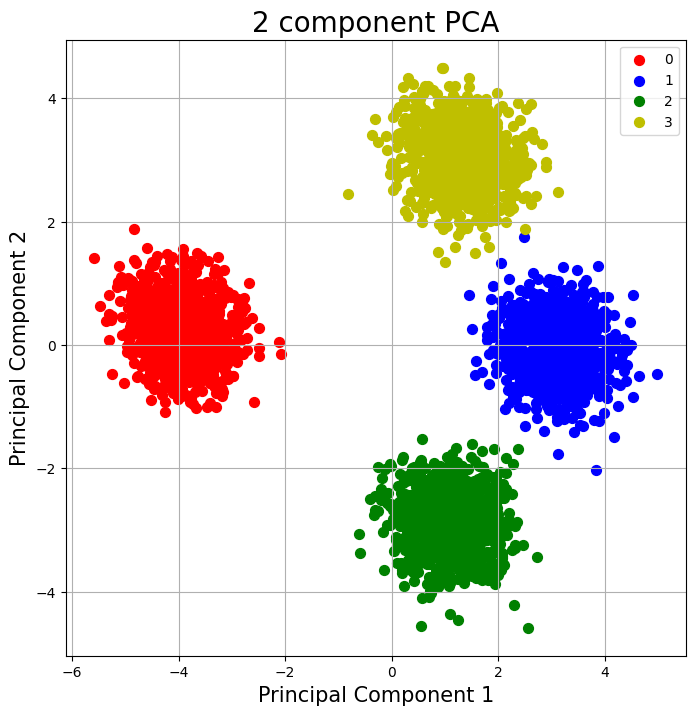

In [428]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [429]:
kmeans_tsne = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [430]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=5, random_state=42)

In [431]:
df_tsne_kmeans = corr_dataset.copy()

In [432]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [433]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [434]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [435]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


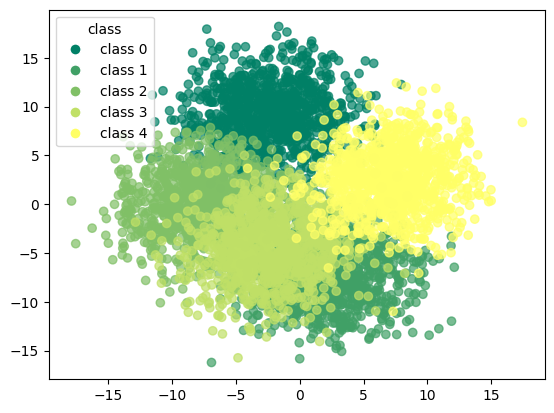

In [436]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

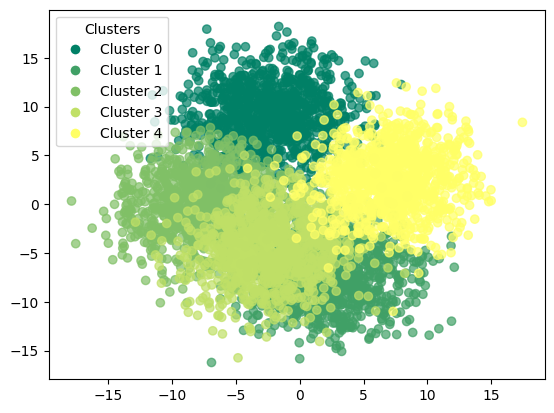

In [437]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

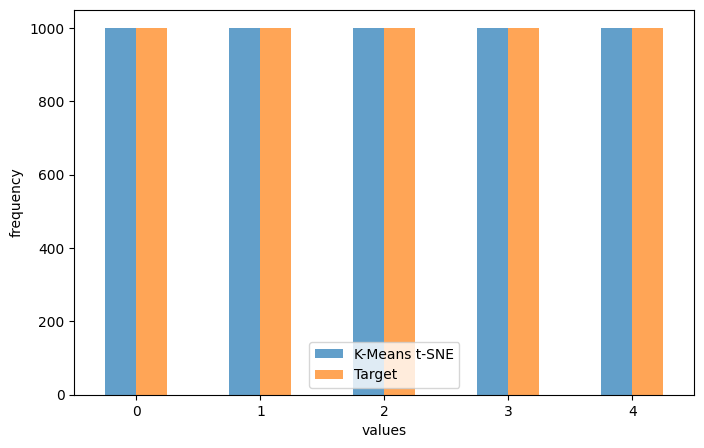

In [438]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [439]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


In [440]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



### k-means with umap

In [441]:
kmeans_umap = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [442]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=5, random_state=42)

In [443]:
df_umap_kmeans = corr_dataset.copy()

In [444]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [445]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [446]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.2
accuracy after: 1.0


In [447]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


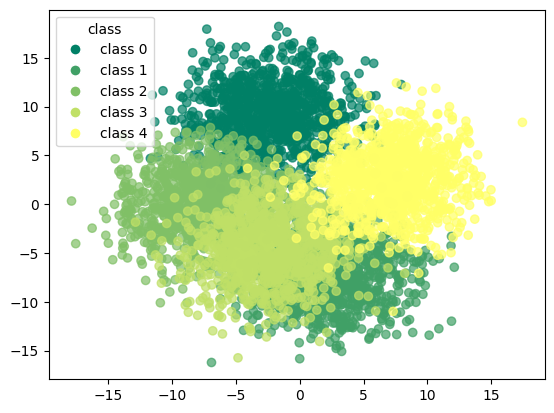

In [448]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

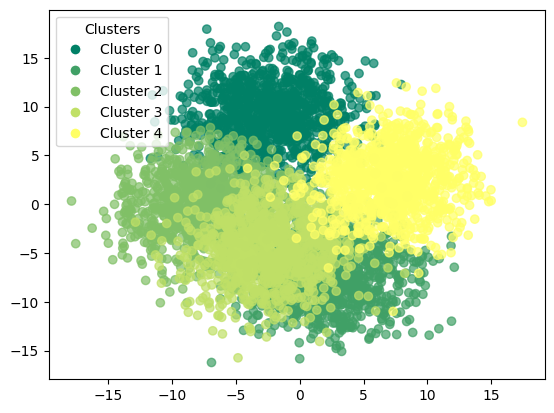

In [449]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

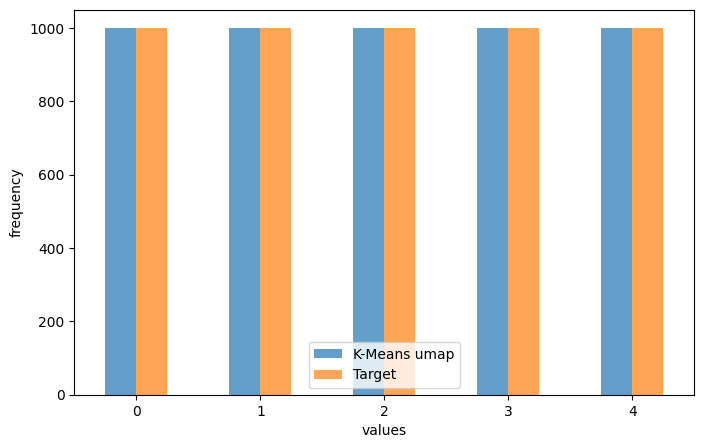

In [450]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [451]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


In [452]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



## trimmed k-means

In [453]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [454]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=5,trim_fraction=0.1)

In [455]:
trimmed_kmeans

KMeans(n_clusters=5, random_state=42)

In [456]:
df_trim_kmeans = corr_dataset.copy()

In [457]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [458]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [459]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
5,0.484134,4.616313,1.890058,2.635989,-3.090227,-6.211843,-8.315040,11.341194,5.586348,-1.100689,...,4.927314,-5.466445,-9.290996,2.876605,-5.928403,-2.660847,-1.244828,-7.979265,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.594837,4.828317,2.556839,-13.645545,-5.246862,-6.818271,1.047325,-0.578350,7.388077,1.894203,...,12.461477,7.381753,3.144268,4.263935,-4.584264,-2.743011,-9.866732,-9.592695,4,1
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [460]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.3
accuracy after: 0.7004444444444444


In [461]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
5,0.484134,4.616313,1.890058,2.635989,-3.090227,-6.211843,-8.315040,11.341194,5.586348,-1.100689,...,4.927314,-5.466445,-9.290996,2.876605,-5.928403,-2.660847,-1.244828,-7.979265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.594837,4.828317,2.556839,-13.645545,-5.246862,-6.818271,1.047325,-0.578350,7.388077,1.894203,...,12.461477,7.381753,3.144268,4.263935,-4.584264,-2.743011,-9.866732,-9.592695,4,2
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,2
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,2


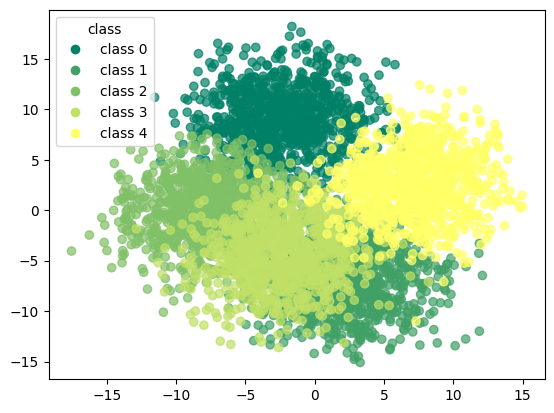

In [462]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

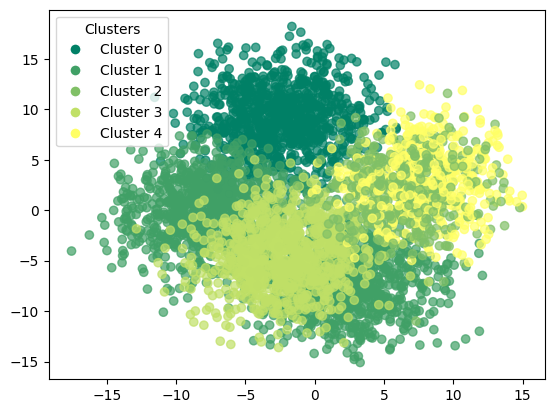

In [463]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [464]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[903   0   0   0   0]
 [  0 899   0   0   0]
 [  0 895   0   0   0]
 [  0   0   0 896   0]
 [  0   0 453   0 454]]


In [465]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       903
           1       0.50      1.00      0.67       899
           2       0.00      0.00      0.00       895
           3       1.00      1.00      1.00       896
           4       1.00      0.50      0.67       907

    accuracy                           0.70      4500
   macro avg       0.70      0.70      0.67      4500
weighted avg       0.70      0.70      0.67      4500



### trimmed k-means with pca

In [466]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=5,trim_fraction=0.1)

In [467]:
trim_kmeans_pca

KMeans(n_clusters=5, random_state=42)

In [468]:
df_pca_trim_kmeans = corr_dataset.copy()

In [469]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [470]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [471]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
5,0.484134,4.616313,1.890058,2.635989,-3.090227,-6.211843,-8.315040,11.341194,5.586348,-1.100689,...,4.927314,-5.466445,-9.290996,2.876605,-5.928403,-2.660847,-1.244828,-7.979265,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.594837,4.828317,2.556839,-13.645545,-5.246862,-6.818271,1.047325,-0.578350,7.388077,1.894203,...,12.461477,7.381753,3.144268,4.263935,-4.584264,-2.743011,-9.866732,-9.592695,4,4
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


In [472]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.3962222222222222
accuracy after: 0.9933333333333333


In [473]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
5,0.484134,4.616313,1.890058,2.635989,-3.090227,-6.211843,-8.315040,11.341194,5.586348,-1.100689,...,4.927314,-5.466445,-9.290996,2.876605,-5.928403,-2.660847,-1.244828,-7.979265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.594837,4.828317,2.556839,-13.645545,-5.246862,-6.818271,1.047325,-0.578350,7.388077,1.894203,...,12.461477,7.381753,3.144268,4.263935,-4.584264,-2.743011,-9.866732,-9.592695,4,4
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


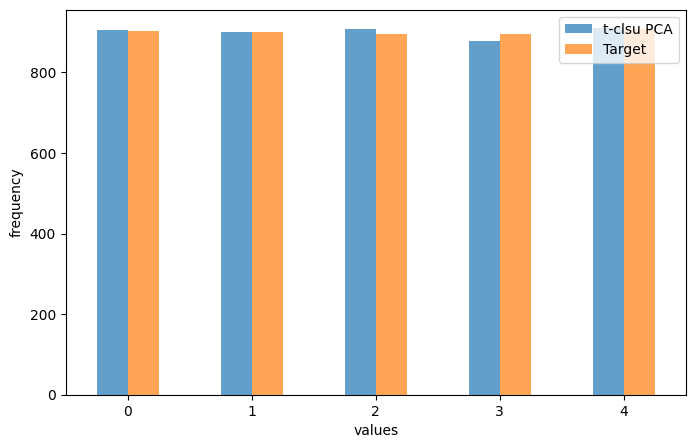

In [474]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [475]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[899   0   0   0   4]
 [  3 896   0   0   0]
 [  0   3 892   0   0]
 [  0   0  15 879   2]
 [  3   0   0   0 904]]


In [476]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       903
           1       1.00      1.00      1.00       899
           2       0.98      1.00      0.99       895
           3       1.00      0.98      0.99       896
           4       0.99      1.00      1.00       907

    accuracy                           0.99      4500
   macro avg       0.99      0.99      0.99      4500
weighted avg       0.99      0.99      0.99      4500



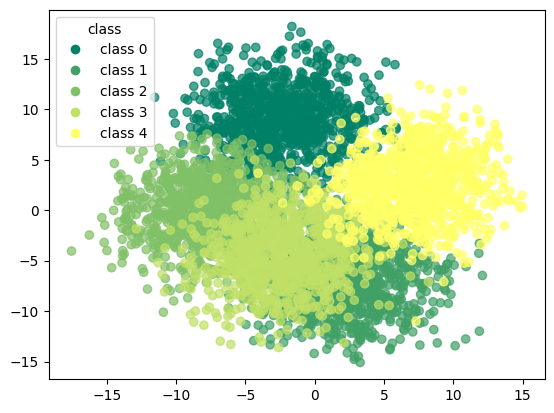

In [477]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

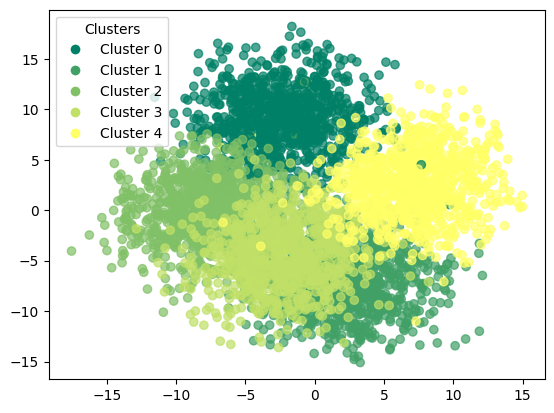

In [478]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

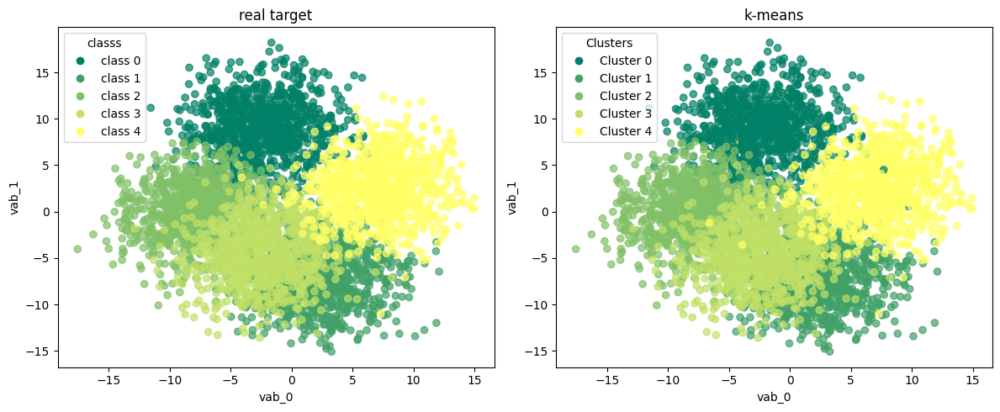

In [479]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

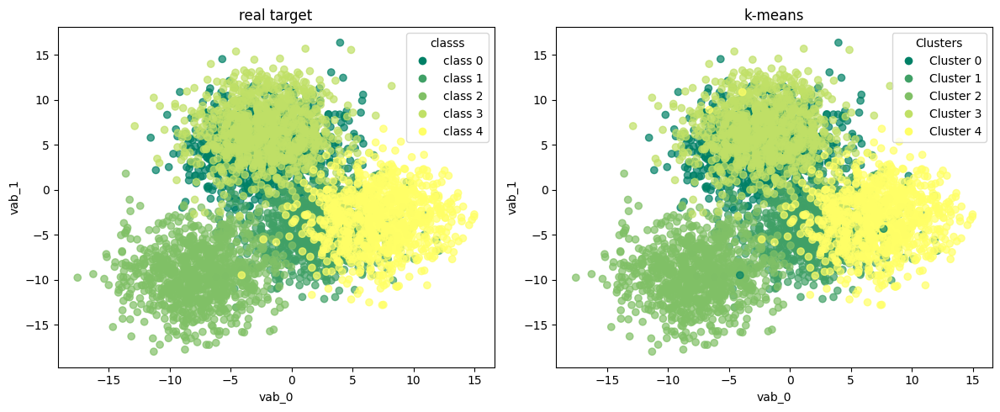

In [480]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [481]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=5,trim_fraction=0.1)

In [482]:
trim_kmeans_tsne

KMeans(n_clusters=5, random_state=42)

In [483]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [484]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [485]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [486]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
5,0.484134,4.616313,1.890058,2.635989,-3.090227,-6.211843,-8.315040,11.341194,5.586348,-1.100689,...,4.927314,-5.466445,-9.290996,2.876605,-5.928403,-2.660847,-1.244828,-7.979265,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.594837,4.828317,2.556839,-13.645545,-5.246862,-6.818271,1.047325,-0.578350,7.388077,1.894203,...,12.461477,7.381753,3.144268,4.263935,-4.584264,-2.743011,-9.866732,-9.592695,4,1
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [487]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.19822222222222222
accuracy after: 0.9924444444444445


In [488]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
5,0.484134,4.616313,1.890058,2.635989,-3.090227,-6.211843,-8.315040,11.341194,5.586348,-1.100689,...,4.927314,-5.466445,-9.290996,2.876605,-5.928403,-2.660847,-1.244828,-7.979265,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.594837,4.828317,2.556839,-13.645545,-5.246862,-6.818271,1.047325,-0.578350,7.388077,1.894203,...,12.461477,7.381753,3.144268,4.263935,-4.584264,-2.743011,-9.866732,-9.592695,4,4
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


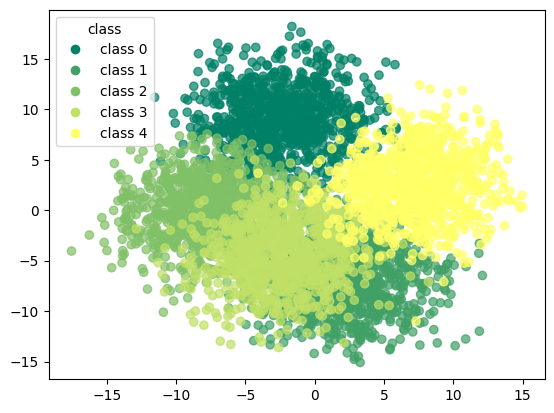

In [489]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

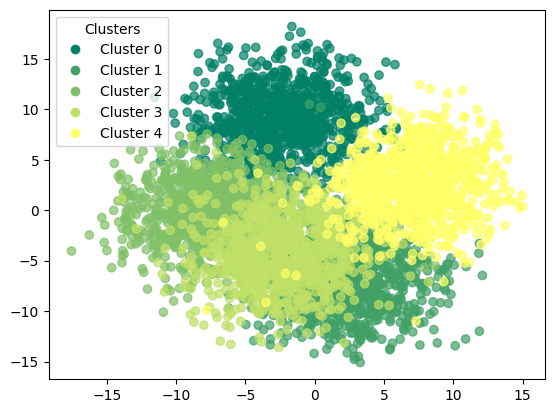

In [490]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

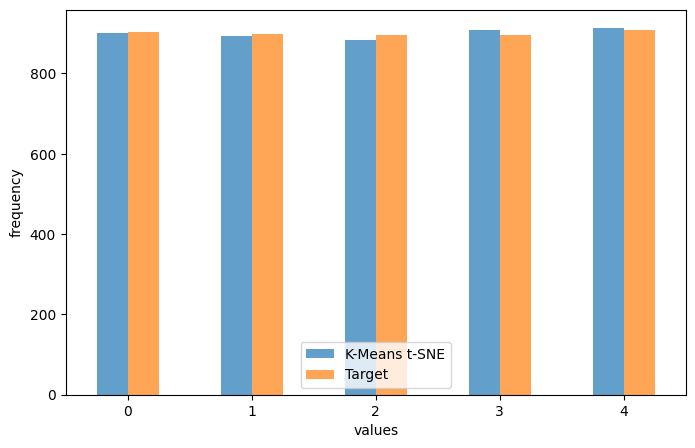

In [491]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [492]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[901   2   0   0   0]
 [  0 892   7   0   0]
 [  0   0 876  19   0]
 [  0   0   0 890   6]
 [  0   0   0   0 907]]


In [493]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       903
           1       1.00      0.99      0.99       899
           2       0.99      0.98      0.99       895
           3       0.98      0.99      0.99       896
           4       0.99      1.00      1.00       907

    accuracy                           0.99      4500
   macro avg       0.99      0.99      0.99      4500
weighted avg       0.99      0.99      0.99      4500



### trimmed k-means with umap

In [494]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=3,trim_fraction=0.1)

In [495]:
trim_kmeans_umap

KMeans(n_clusters=3, random_state=42)

In [496]:
df_umap_trim_kmeans = corr_dataset.copy()

In [497]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [498]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [499]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4994,10.794551,7.827523,-1.500594,-10.396867,3.607632,4.222850,5.265081,4.770720,12.688824,-1.812791,...,2.806238,-3.040118,7.022319,-2.717089,2.358779,2.887759,-6.128140,-11.962017,4,1
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [500]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.0
accuracy after: 0.624


In [501]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4994,10.794551,7.827523,-1.500594,-10.396867,3.607632,4.222850,5.265081,4.770720,12.688824,-1.812791,...,2.806238,-3.040118,7.022319,-2.717089,2.358779,2.887759,-6.128140,-11.962017,4,2
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,2
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,2
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,2


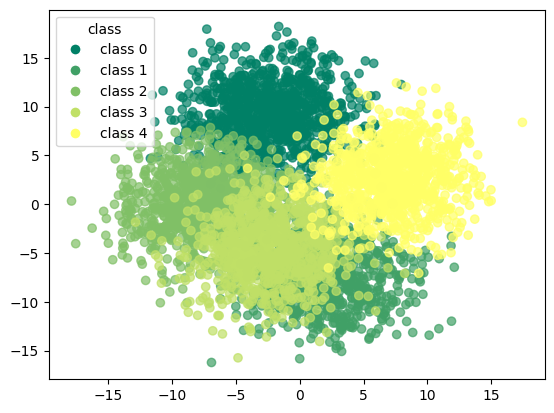

In [502]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

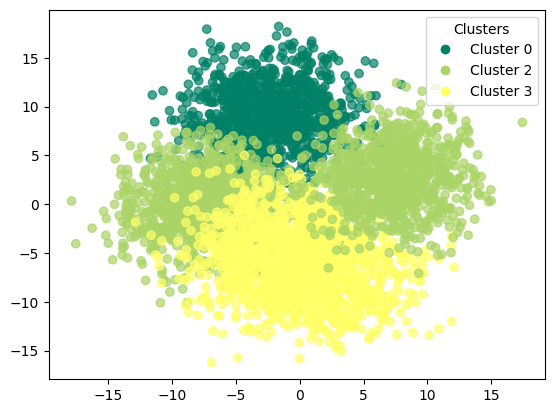

In [503]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

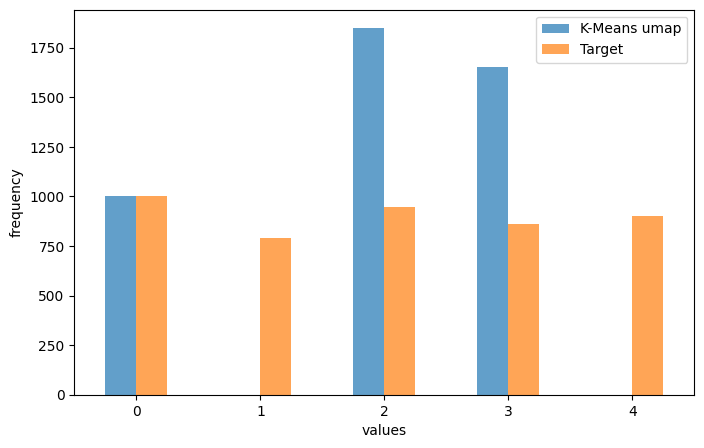

In [504]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [505]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1000    0    0    0    0]
 [   0    0    0  790    0]
 [   0    0  947    0    0]
 [   0    0    0  861    0]
 [   0    0  902    0    0]]


In [506]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       0.00      0.00      0.00       790
           2       0.51      1.00      0.68       947
           3       0.52      1.00      0.69       861
           4       0.00      0.00      0.00       902

    accuracy                           0.62      4500
   macro avg       0.41      0.60      0.47      4500
weighted avg       0.43      0.62      0.50      4500



## dbscan

In [507]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

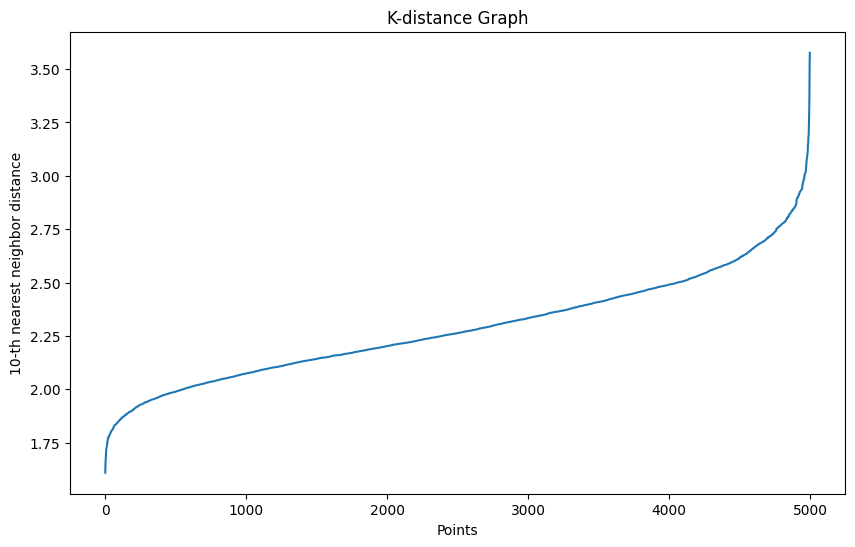

In [508]:
plot_k_distance_graph(X_values,k=10) 

In [509]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [510]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [511]:
df_dbscan = corr_dataset.copy()

In [512]:
df_dbscan['dbscan'] = dbscan.labels_

In [513]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [514]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,-1
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,-1
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,-1
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,-1
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,-1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,-1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,-1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,-1


In [515]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    5000
Name: count, dtype: int64


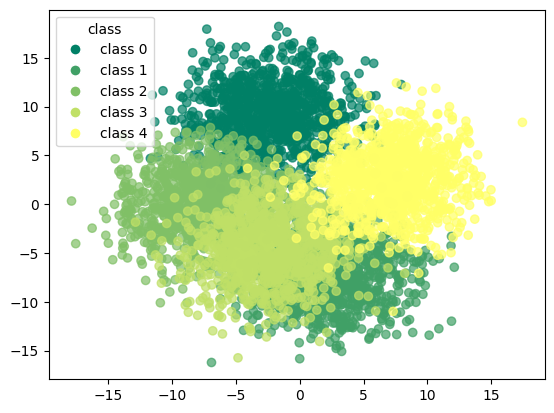

In [516]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

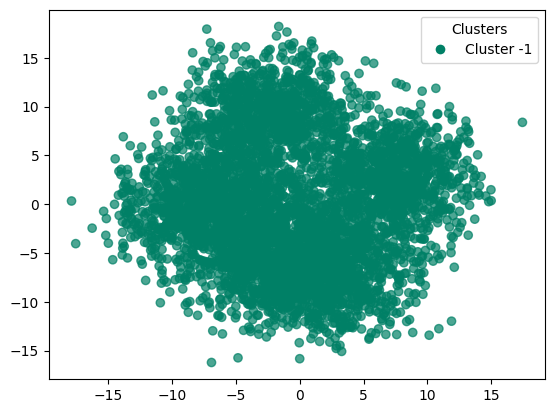

In [517]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [518]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]]


In [519]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1000.0
           1       0.00      0.00      0.00    1000.0
           2       0.00      0.00      0.00    1000.0
           3       0.00      0.00      0.00    1000.0
           4       0.00      0.00      0.00    1000.0

    accuracy                           0.00    5000.0
   macro avg       0.00      0.00      0.00    5000.0
weighted avg       0.00      0.00      0.00    5000.0



### dbscan with pca

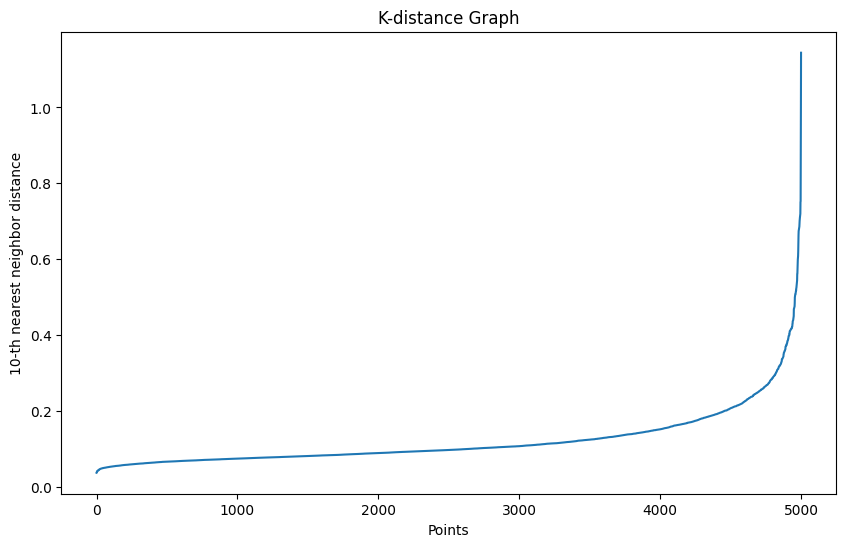

In [520]:
plot_k_distance_graph(X_pca,k=10)

In [521]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [522]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [523]:
df_pca_dbscan = corr_dataset.copy()

In [524]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [525]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.7956
accuracy after: 0.596


In [526]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,5
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,5
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,5
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,5
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,5
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,5
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,5
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,5


In [527]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 5    1996
 3     997
 1     992
 2     991
-1      24
Name: count, dtype: int64


In [528]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[  0   0   0   0   0   0   0]
 [  2   0   0   0   0   0 998]
 [  8   0 992   0   0   0   0]
 [  9   0   0 991   0   0   0]
 [  3   0   0   0 997   0   0]
 [  2   0   0   0   0   0 998]
 [  0   0   0   0   0   0   0]]


In [529]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1000
           1       1.00      0.99      1.00      1000
           2       1.00      0.99      1.00      1000
           3       1.00      1.00      1.00      1000
           4       0.00      0.00      0.00      1000
           5       0.00      0.00      0.00         0

    accuracy                           0.60      5000
   macro avg       0.43      0.43      0.43      5000
weighted avg       0.60      0.60      0.60      5000



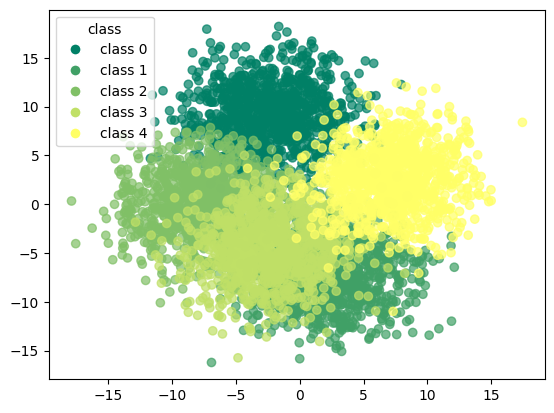

In [530]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

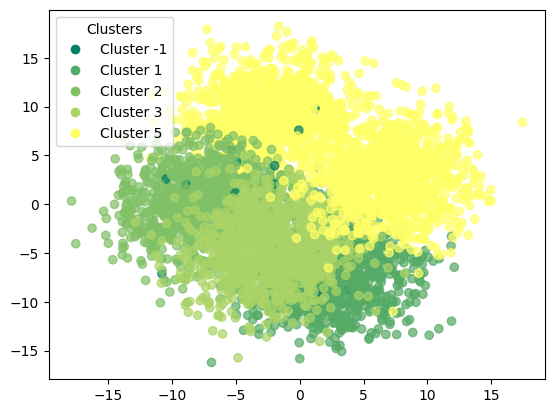

In [531]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

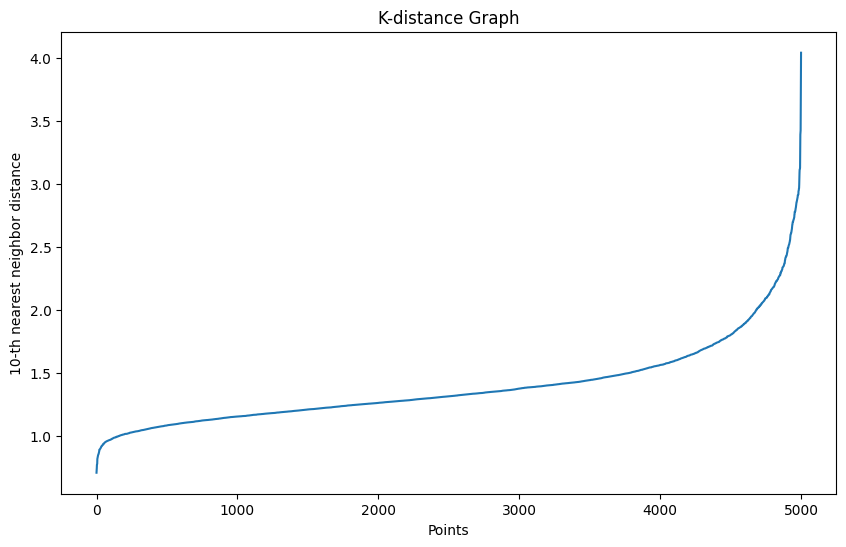

In [532]:
plot_k_distance_graph(X_tsne,k=10)

In [533]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [534]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [535]:
df_tsne_dbscan = corr_dataset.copy()

In [536]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [537]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [538]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


In [539]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
0    1000
1    1000
2    1000
3    1000
4    1000
Name: count, dtype: int64


In [540]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


In [541]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



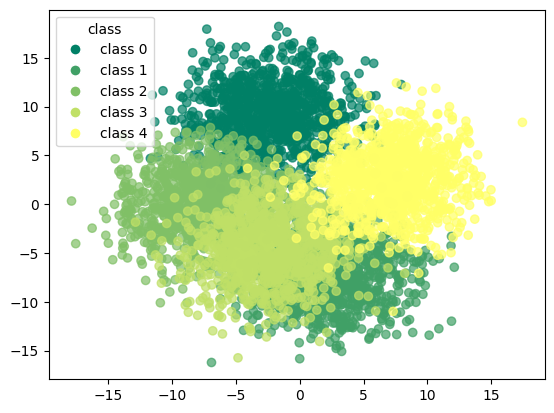

In [542]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

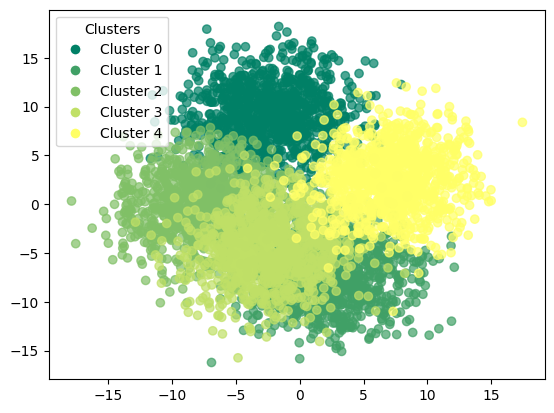

In [543]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

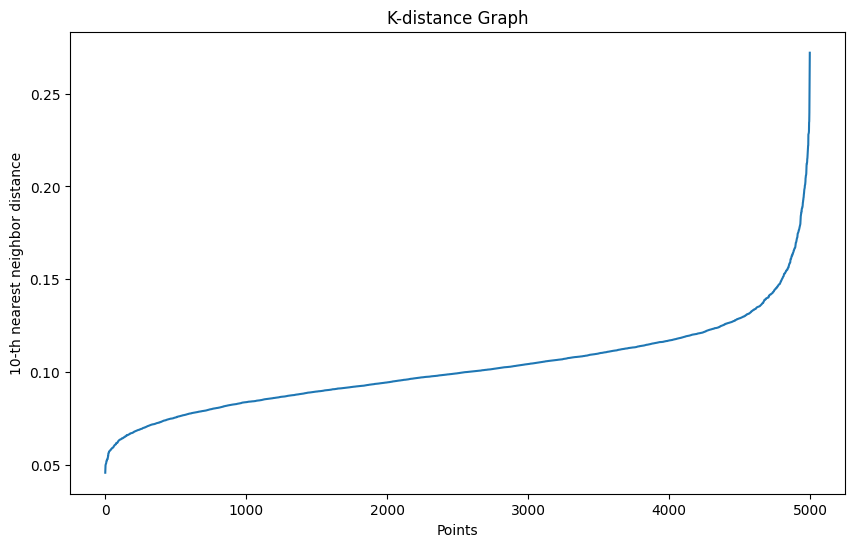

In [544]:
plot_k_distance_graph(X_umap,k=10)

In [545]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [546]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [547]:
df_umap_dbscan = corr_dataset.copy()

In [548]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [549]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [550]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,4
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,4
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,4
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,4


In [551]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    1000
1    1000
2    1000
3    1000
4    1000
Name: count, dtype: int64


In [552]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


In [553]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



## GMM - Gaussian Mixture Models

In [554]:
gmm = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [555]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [556]:
df_gmm = corr_dataset.copy()

In [557]:
df_gmm['gmm'] = gmm.predict(X_values)

In [558]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,2
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,2
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,2
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,2


In [559]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.0
accuracy after: 0.6


In [560]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,0
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,0
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,0
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,0


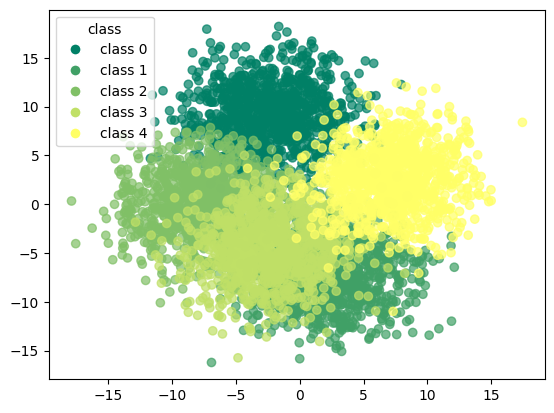

In [561]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

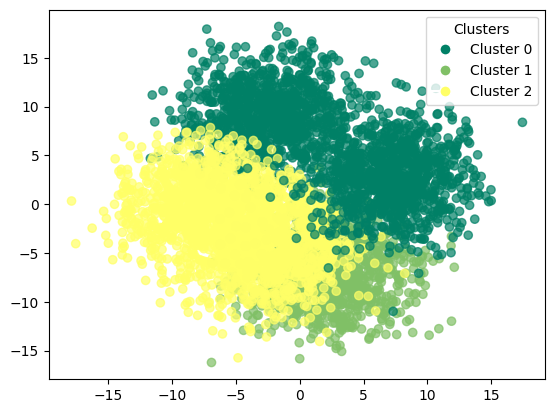

In [562]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [563]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0 1000    0    0]
 [1000    0    0    0    0]]


In [564]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1000
           1       1.00      1.00      1.00      1000
           2       0.50      1.00      0.67      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



### GMM with pca

In [565]:
gmm_pca = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [566]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [567]:
df_pca_gmm = corr_dataset.copy()

In [568]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [569]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [570]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.0
accuracy after: 0.5904


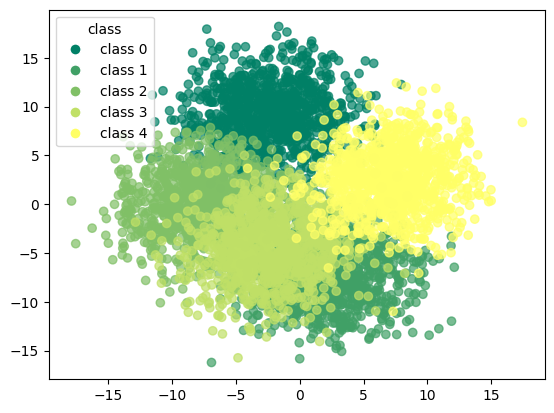

In [571]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

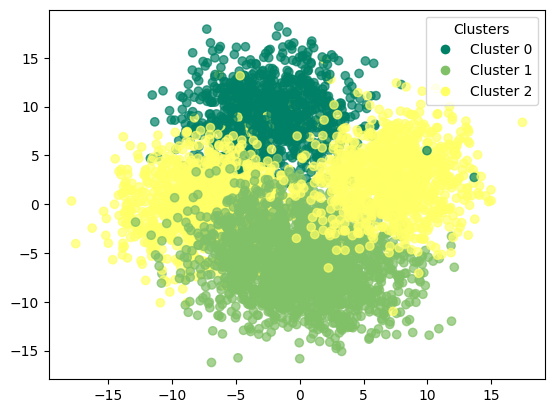

In [572]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [573]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[ 953    0   47    0    0]
 [   0 1000    0    0    0]
 [   0    1  999    0    0]
 [   0 1000    0    0    0]
 [   4    0  996    0    0]]


In [574]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1000
           1       0.50      1.00      0.67      1000
           2       0.49      1.00      0.66      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.59      5000
   macro avg       0.40      0.59      0.46      5000
weighted avg       0.40      0.59      0.46      5000



### GMM with t-SNE

In [575]:
gmm_tsne = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [576]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [577]:
df_tsne_gmm = corr_dataset.copy()

In [578]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [579]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [580]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.0
accuracy after: 0.6


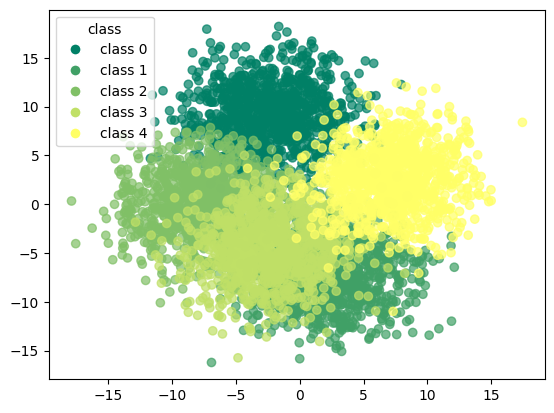

In [581]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

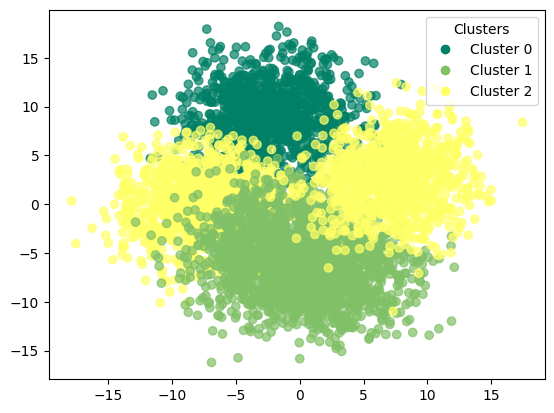

In [582]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [583]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0  999    1    0    0]
 [   0    0 1000    0    0]]


In [584]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       0.50      1.00      0.67      1000
           2       0.50      1.00      0.67      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



### GMM with umap

In [585]:
gmm_umap = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [586]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [587]:
df_umap_gmm = corr_dataset.copy()

In [588]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [589]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


In [590]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.0
accuracy after: 0.6


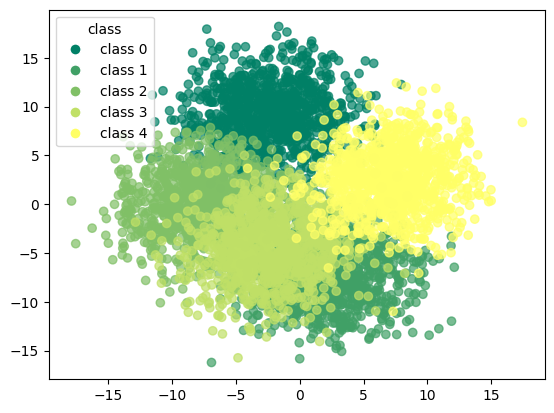

In [591]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

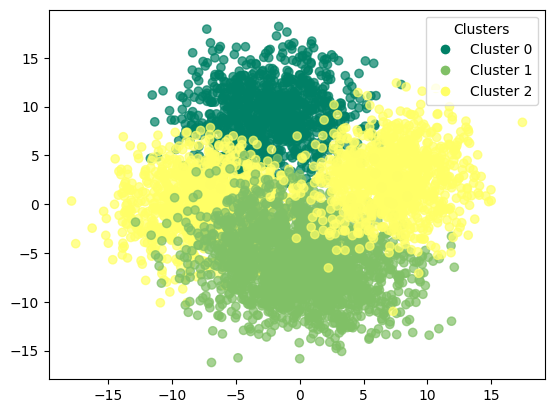

In [592]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [593]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]]


In [594]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       0.50      1.00      0.67      1000
           2       0.50      1.00      0.67      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



## pam

In [595]:
initial_medoids = np.random.choice(len(X_values),3,replace=False)

In [596]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [597]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [598]:
pam.process()

In [599]:
clusters = pam.get_clusters()

In [600]:
medoids = pam.get_medoids()

In [601]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [602]:
df_pam = corr_dataset.copy()

In [603]:
df_pam['pam'] = labels

In [604]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,1.0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,1.0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,1.0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,1.0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1.0
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1.0
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1.0
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1.0


In [605]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.0
accuracy after: 0.6


In [606]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,0
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,0
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,0
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,0


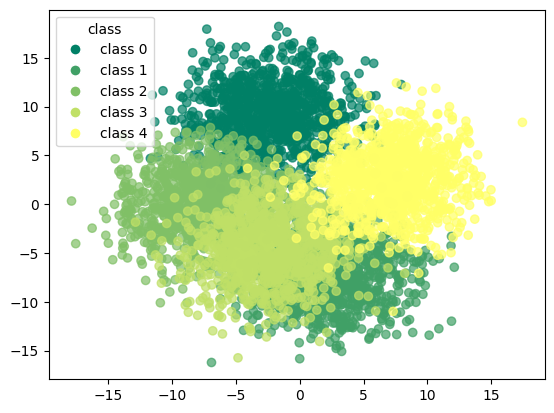

In [607]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

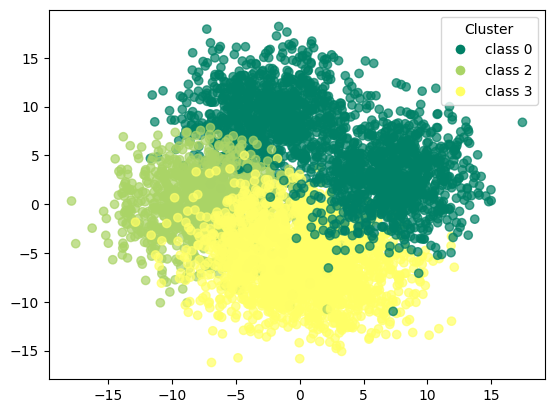

In [608]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [609]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1000    0    0    0    0]
 [   0    0   10  990    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [1000    0    0    0    0]]


In [610]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1000
           1       0.00      0.00      0.00      1000
           2       0.99      1.00      1.00      1000
           3       0.50      1.00      0.67      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



### pam with pca

In [611]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [612]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [613]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [614]:
pam_pca.process()

In [615]:
clusters = pam_pca.get_clusters()

In [616]:
medoids = pam_pca.get_medoids()

In [617]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [618]:
df_pam_pca = corr_dataset.copy()

In [619]:
df_pam_pca['pam_pca'] = labels

In [620]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2.0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2.0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2.0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2.0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,0.0
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,2.0
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,2.0
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,2.0


In [621]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.006
accuracy after: 0.6


In [622]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,2
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,0
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,0
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,0


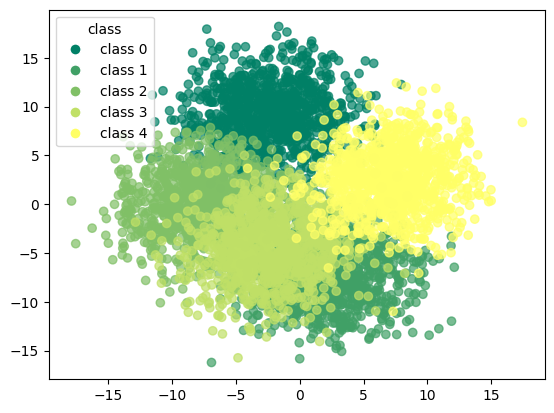

In [623]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

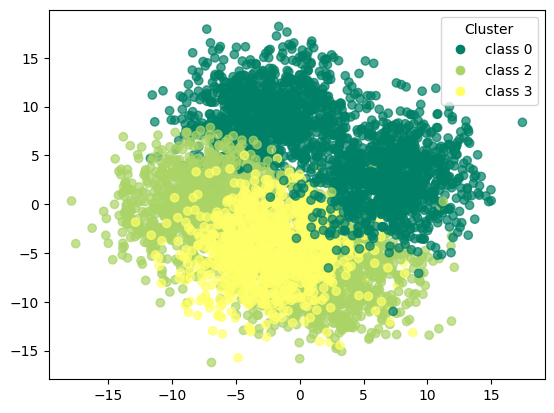

In [624]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [625]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1000    0    0    0    0]
 [   0    0  970   30    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [ 994    0    6    0    0]]


In [626]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1000
           1       0.00      0.00      0.00      1000
           2       0.51      1.00      0.67      1000
           3       0.97      1.00      0.99      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



### pam with t-SNE

In [627]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [628]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [629]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [630]:
pam_tsne.process()

In [631]:
clusters = pam_tsne.get_clusters()

In [632]:
medoids = pam_tsne.get_medoids()

In [633]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [634]:
df_pam_tsne = corr_dataset.copy()

In [635]:
df_pam_tsne['pam_tsne'] = labels

In [636]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,2.0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,2.0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,2.0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,2.0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1.0
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1.0
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1.0
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1.0


In [637]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.2
accuracy after: 0.6


In [638]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,1
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


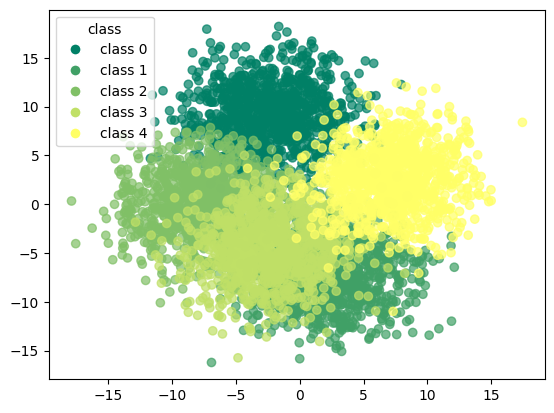

In [639]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

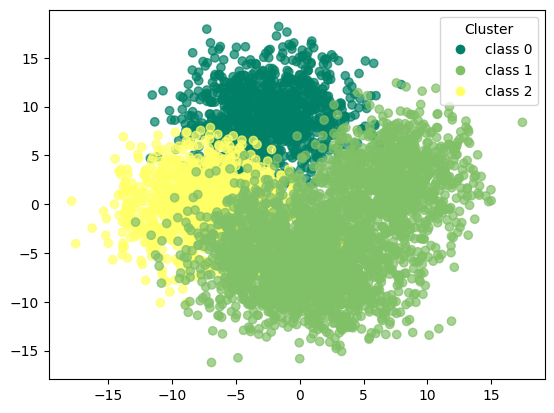

In [640]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [641]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0 1000    0    0    0]
 [   0 1000    0    0    0]]


In [642]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       0.33      1.00      0.50      1000
           2       1.00      1.00      1.00      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.47      0.60      0.50      5000
weighted avg       0.47      0.60      0.50      5000



### pam with umap

In [643]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [644]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [645]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [646]:
pam_umap.process()

In [647]:
clusters = pam_umap.get_clusters()

In [648]:
medoids = pam_umap.get_medoids()

In [649]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [650]:
df_pam_umap = corr_dataset.copy()

In [651]:
df_pam_umap['pam_umap'] = labels

In [652]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,1.0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,1.0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,1.0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,1.0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,2.0
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,1.0
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,1.0
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,0.0


In [653]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.2
accuracy after: 0.6


In [654]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,0.109079,5.133210,7.214212,-0.465648,-8.957115,-6.907163,-9.495840,2.300924,6.053565,8.028347,...,5.564823,-8.654327,-6.772973,-9.671256,-3.318516,-2.306432,-6.208707,-16.277692,0,0
1,-3.914104,8.251843,6.575540,-4.008793,-5.203808,-9.026921,-10.666182,6.214203,0.774515,-3.187335,...,8.169759,-4.882698,-7.582731,-12.673041,-3.473997,0.163634,-2.014202,-2.938610,0,0
2,-3.607806,7.305995,0.230806,1.666360,-3.329526,-10.572969,-6.067157,9.574050,-4.127003,4.378545,...,11.618811,-3.749333,-9.092647,-4.831030,-7.152339,-2.627478,-2.272414,-1.114493,0,0
3,-5.695706,7.600287,8.399757,-1.009404,-6.862420,-9.052701,-4.550378,8.682528,1.659805,1.996573,...,6.106581,-4.399292,-3.629149,-9.557429,-3.393185,-0.862202,-1.752725,-0.753374,0,0
4,0.876674,11.086762,0.872211,2.361664,-8.764033,-2.978366,-10.749733,4.814042,3.490035,7.870495,...,10.363862,-0.202680,-5.465496,-7.739318,-7.019443,4.432099,-0.613745,-6.798554,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11.240749,0.273857,-5.822952,-11.076730,0.132475,1.874288,8.917421,5.026937,5.054327,2.328254,...,6.870746,4.056578,13.932298,2.226329,-2.089707,-2.238595,-11.422582,-8.308322,4,2
4996,7.535566,-3.158913,2.581536,-13.904515,-1.202937,-5.138090,-0.853990,-1.429180,6.476400,-0.908563,...,6.572426,-8.186574,4.420663,2.588552,-1.154486,-5.235103,-12.986634,-9.943112,4,0
4997,2.679852,10.169422,-5.346877,-8.773529,-8.022739,4.650924,6.018761,5.248543,7.170975,0.914851,...,8.719378,1.035954,7.870513,-1.133546,-2.858406,-4.806948,-11.999882,-13.742369,4,0
4998,8.692624,1.223445,-7.622941,-12.908497,-9.601453,0.141628,6.088205,4.361334,9.746394,-0.443288,...,4.292135,2.249620,6.283407,-0.678207,-2.466723,-1.054374,-11.619279,-8.492768,4,1


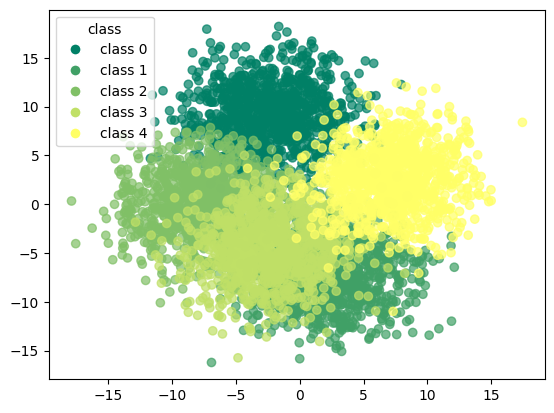

In [655]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

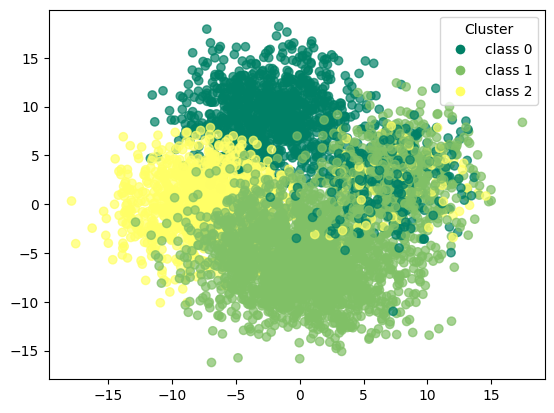

In [656]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [657]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0 1000    0    0    0]
 [ 307  596   97    0    0]]


In [658]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.77      1.00      0.87      1000
           1       0.39      1.00      0.56      1000
           2       0.91      1.00      0.95      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.41      0.60      0.48      5000
weighted avg       0.41      0.60      0.48      5000



# overall results k-means

## basic

In [659]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [660]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


## + pca

In [661]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       0.99      0.99      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [662]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[ 992    0    0    0    8]
 [   0  999    0    1    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [  10    0    0    0  990]]


## + t-SNE

In [663]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [664]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


## + UMAP

In [665]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [666]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


# overall results trimmed k-means

## basic

In [667]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       903
           1       0.50      1.00      0.67       899
           2       0.00      0.00      0.00       895
           3       1.00      1.00      1.00       896
           4       1.00      0.50      0.67       907

    accuracy                           0.70      4500
   macro avg       0.70      0.70      0.67      4500
weighted avg       0.70      0.70      0.67      4500



In [668]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[903   0   0   0   0]
 [  0 899   0   0   0]
 [  0 895   0   0   0]
 [  0   0   0 896   0]
 [  0   0 453   0 454]]


## + pca

In [669]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       903
           1       1.00      1.00      1.00       899
           2       0.98      1.00      0.99       895
           3       1.00      0.98      0.99       896
           4       0.99      1.00      1.00       907

    accuracy                           0.99      4500
   macro avg       0.99      0.99      0.99      4500
weighted avg       0.99      0.99      0.99      4500



In [670]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[899   0   0   0   4]
 [  3 896   0   0   0]
 [  0   3 892   0   0]
 [  0   0  15 879   2]
 [  3   0   0   0 904]]


## + t-SNE

In [671]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       903
           1       1.00      0.99      0.99       899
           2       0.99      0.98      0.99       895
           3       0.98      0.99      0.99       896
           4       0.99      1.00      1.00       907

    accuracy                           0.99      4500
   macro avg       0.99      0.99      0.99      4500
weighted avg       0.99      0.99      0.99      4500



In [672]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[901   2   0   0   0]
 [  0 892   7   0   0]
 [  0   0 876  19   0]
 [  0   0   0 890   6]
 [  0   0   0   0 907]]


## + UMAP

In [673]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       0.00      0.00      0.00       790
           2       0.51      1.00      0.68       947
           3       0.52      1.00      0.69       861
           4       0.00      0.00      0.00       902

    accuracy                           0.62      4500
   macro avg       0.41      0.60      0.47      4500
weighted avg       0.43      0.62      0.50      4500



In [674]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1000    0    0    0    0]
 [   0    0    0  790    0]
 [   0    0  947    0    0]
 [   0    0    0  861    0]
 [   0    0  902    0    0]]


# overall results dbscan

## basic

In [675]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1000.0
           1       0.00      0.00      0.00    1000.0
           2       0.00      0.00      0.00    1000.0
           3       0.00      0.00      0.00    1000.0
           4       0.00      0.00      0.00    1000.0

    accuracy                           0.00    5000.0
   macro avg       0.00      0.00      0.00    5000.0
weighted avg       0.00      0.00      0.00    5000.0



In [676]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]]


## + pca

In [677]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1000
           1       1.00      0.99      1.00      1000
           2       1.00      0.99      1.00      1000
           3       1.00      1.00      1.00      1000
           4       0.00      0.00      0.00      1000
           5       0.00      0.00      0.00         0

    accuracy                           0.60      5000
   macro avg       0.43      0.43      0.43      5000
weighted avg       0.60      0.60      0.60      5000



In [678]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[  0   0   0   0   0   0   0]
 [  2   0   0   0   0   0 998]
 [  8   0 992   0   0   0   0]
 [  9   0   0 991   0   0   0]
 [  3   0   0   0 997   0   0]
 [  2   0   0   0   0   0 998]
 [  0   0   0   0   0   0   0]]


## + t-SNE

In [679]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [680]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


## + UMAP

In [681]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
           2       1.00      1.00      1.00      1000
           3       1.00      1.00      1.00      1000
           4       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [682]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [   0    0    0    0 1000]]


# overall results GMM

## basic

In [683]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1000
           1       1.00      1.00      1.00      1000
           2       0.50      1.00      0.67      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



In [684]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0    0 1000    0    0]
 [1000    0    0    0    0]]


## + pca

In [685]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1000
           1       0.50      1.00      0.67      1000
           2       0.49      1.00      0.66      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.59      5000
   macro avg       0.40      0.59      0.46      5000
weighted avg       0.40      0.59      0.46      5000



In [686]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[ 953    0   47    0    0]
 [   0 1000    0    0    0]
 [   0    1  999    0    0]
 [   0 1000    0    0    0]
 [   4    0  996    0    0]]


## + t-SNE

In [687]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       0.50      1.00      0.67      1000
           2       0.50      1.00      0.67      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



In [688]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0  999    1    0    0]
 [   0    0 1000    0    0]]


## + UMAP

In [689]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       0.50      1.00      0.67      1000
           2       0.50      1.00      0.67      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



In [690]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]]


# overall results pam

## basic

In [691]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1000    0    0    0    0]
 [   0    0   10  990    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [1000    0    0    0    0]]


In [692]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1000
           1       0.00      0.00      0.00      1000
           2       0.99      1.00      1.00      1000
           3       0.50      1.00      0.67      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



## + pca

In [693]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1000    0    0    0    0]
 [   0    0  970   30    0]
 [   0    0 1000    0    0]
 [   0    0    0 1000    0]
 [ 994    0    6    0    0]]


In [694]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1000
           1       0.00      0.00      0.00      1000
           2       0.51      1.00      0.67      1000
           3       0.97      1.00      0.99      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.40      0.60      0.47      5000
weighted avg       0.40      0.60      0.47      5000



## + t-SNE

In [695]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0 1000    0    0    0]
 [   0 1000    0    0    0]]


In [696]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       0.33      1.00      0.50      1000
           2       1.00      1.00      1.00      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.47      0.60      0.50      5000
weighted avg       0.47      0.60      0.50      5000



## + umap

In [697]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1000    0    0    0    0]
 [   0 1000    0    0    0]
 [   0    0 1000    0    0]
 [   0 1000    0    0    0]
 [ 307  596   97    0    0]]


In [698]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.77      1.00      0.87      1000
           1       0.39      1.00      0.56      1000
           2       0.91      1.00      0.95      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.60      5000
   macro avg       0.41      0.60      0.48      5000
weighted avg       0.41      0.60      0.48      5000

